# Customer Segmentation

<br>
Customer segmentation is a strategic marketing technique that involves dividing a customer base into distinct groups or segments based on shared characteristics or behaviours. 
Customer segmentation aims to identify subsets of customers with similar needs, preferences, or behaviours, allowing businesses to tailor their marketing strategies and offerings to better meet the specific needs of each segment. 
By understanding the unique characteristics and behaviours of different customer segments, businesses can enhance customer satisfaction, increase engagement, and drive more effective marketing campaigns. Customer segmentation is a fundamental aspect of customer relationship management (CRM) and plays a crucial role in maximizing the efficiency and effectiveness of marketing efforts.

In [1]:
# General
import os
import numpy as np
import pandas as pd

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.colors import ListedColormap
from yellowbrick.cluster import KElbowVisualizer
import seaborn as sns
import plotly.graph_objects as go


# Data Preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering

# Segementation Model
from sklearn.cluster import KMeans

# Dimensionality Reduction
from sklearn.manifold import TSNE

# to ignore warnings
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")

In [2]:
# Setting random seed for reproducibility
seed = 42
np.random.seed(seed)

In [3]:
# Loading data into a data frame
df = pd.read_csv("C:/Users/Mayur chavan/Desktop/sem4 project/creditcard dataset.csv")

# Quick look
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


### Taking a quick look at dataset and its features.

<br>

In [4]:
features = list(df.columns)
n_features = len(features)
n_samples = len(df)

print(f"Number of features : {n_features}")
print(f"Number of Samples  : {n_samples}")
print("Features  : ")
for index, feature in enumerate(features):
    print(f"{index+1:2}. {feature}")

Number of features : 18
Number of Samples  : 8950
Features  : 
 1. CUST_ID
 2. BALANCE
 3. BALANCE_FREQUENCY
 4. PURCHASES
 5. ONEOFF_PURCHASES
 6. INSTALLMENTS_PURCHASES
 7. CASH_ADVANCE
 8. PURCHASES_FREQUENCY
 9. ONEOFF_PURCHASES_FREQUENCY
10. PURCHASES_INSTALLMENTS_FREQUENCY
11. CASH_ADVANCE_FREQUENCY
12. CASH_ADVANCE_TRX
13. PURCHASES_TRX
14. CREDIT_LIMIT
15. PAYMENTS
16. MINIMUM_PAYMENTS
17. PRC_FULL_PAYMENT
18. TENURE


In [5]:
# Data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

### Descriptive statistics

In [6]:
# Data frame statistics
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


<br>

**Checking for null values in our dataset**

In [7]:
# Check for null values
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

Here we find out that column MINIMUM_PAYMENTS has 313 null values, and column CREDIT_LIMIT has 1 null value

<br>

In [8]:
# Check for duplicate Values
df.duplicated().sum()

0

**Describing the field MINIMUM_PAYMENTS**

In [9]:
df.MINIMUM_PAYMENTS.describe()

count     8637.000000
mean       864.206542
std       2372.446607
min          0.019163
25%        169.123707
50%        312.343947
75%        825.485459
max      76406.207520
Name: MINIMUM_PAYMENTS, dtype: float64

<br>

**Imputing the values in MINIMUM_PAYMENTS**

In [10]:
# Fill the missing values with the mean value
simple_imputer = SimpleImputer(strategy="mean")
df.MINIMUM_PAYMENTS = simple_imputer.fit_transform(df.MINIMUM_PAYMENTS.to_numpy().reshape(-1,1))

# Confirmation of the Imputation
df.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        1
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

<br>

Droping the single row with null value in CREDIT_LIMIT

In [11]:
# Drop this single row with the null value
df.dropna(inplace=True)

# Confirmation
df.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

### Normalising and Scaling data

Here first we will scale and normalise the data. By normalizing the data, we improve the information integrity, eliminate redundancies, and enhancing the efficiency and accuracy of the Maching Learning algorithm. We perform scaling to ensure that no single feature dominates the distance calculations in an algorithm, and can help to improve the performance of the algorithm.

In [12]:
# Take a copy of the original data set
data = df.copy()

# Drop the unnecessary columns
data.drop(columns = features[0], inplace = True)

# Apply normalization
norm_data = normalize(data)

# Initialize standards scaler and apply it
scaler = StandardScaler()
scaled_data = scaler.fit_transform(norm_data)

# Final dataset
scaled_data

array([[-0.9418589 ,  2.51351895, -0.36811698, ..., -0.02637805,
        -0.38761659,  3.01516256],
       [ 0.22152701, -0.74991997, -0.92500711, ..., -0.25090963,
        -0.20776637, -0.79553516],
       [ 0.29887531, -0.55916806, -0.34071246, ..., -0.37793698,
        -0.38761659, -0.65195208],
       ...,
       [-1.01764362,  2.62400729, -0.0723584 , ..., -0.36490662,
         1.75829814,  0.93323231],
       [-1.00049826,  6.47911281, -0.92500711, ..., -0.17891966,
         3.95805132,  3.11721441],
       [-0.26970397,  0.40931793,  2.39229148, ..., -0.59088656,
        -0.38761659, -0.10245973]])

<br>

### Visualising and understanding the data.

<br>

In [13]:
def hist(feature, data_frame):
   
    fig = px.histogram(
        data_frame=data_frame,
         x=feature,
        title="{} Histogram".format(feature.title()),
        text_auto=True,
        marginal="rug",
        height=500
    )
    fig.show()

def box(feature, data_frame):
   
    fig = px.box(
        data_frame=data_frame,
        x=feature,
        title="{} Box Plot".format(feature.title()),
        notched=True,
         height=500
    )
    fig.show()

def violin(feature, data_frame):
   
    fig = px.violin(
        data_frame=data_frame,
        x=feature,
        title="{} Violin Plot".format(feature.title()),
        height=500,
    )
    fig.show()
def feature_analysis(index, data_frame = df):
  
    hist(features[index], data_frame)
    box(features[index], data_frame)
    violin(features[index], data_frame)    

   

In [14]:
plt.style.use('fivethirtyeight')

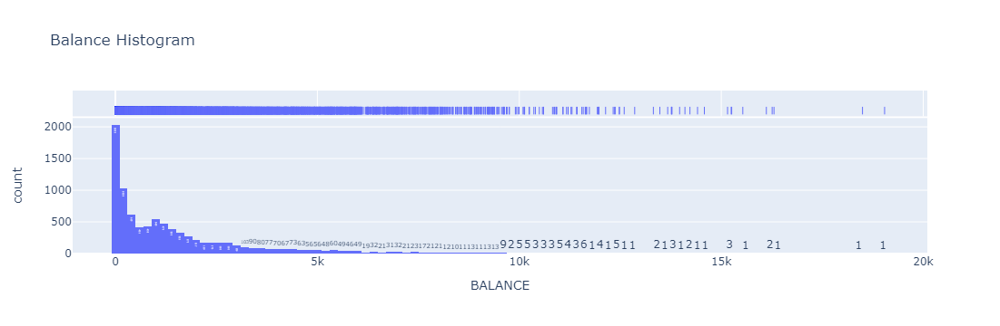

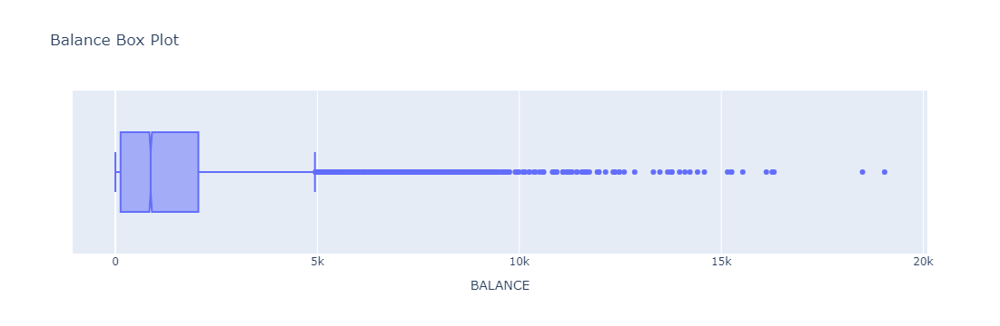

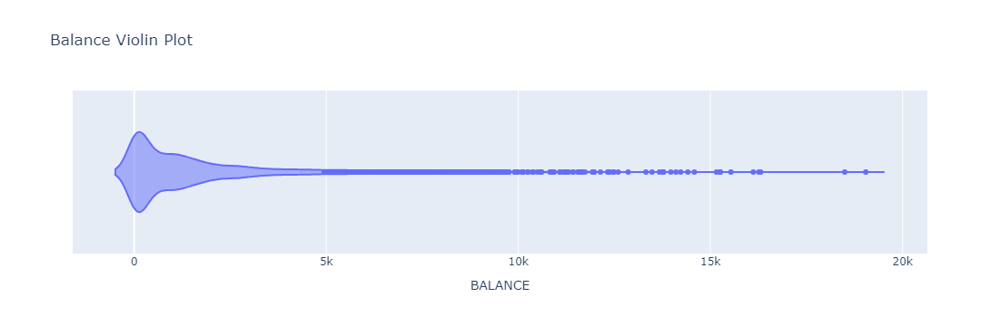

In [15]:
feature_analysis(1)

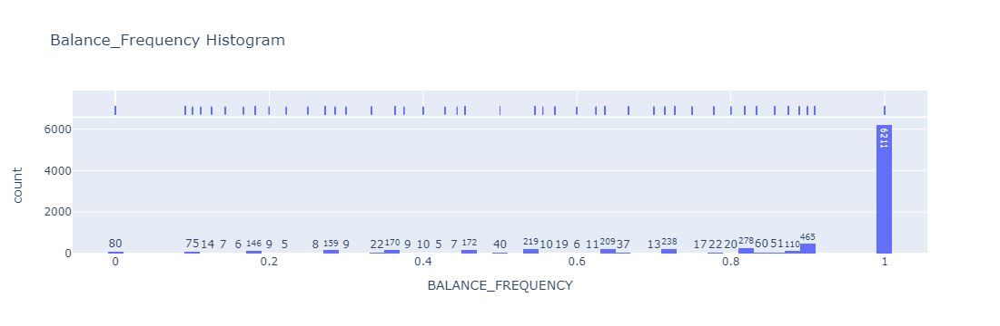

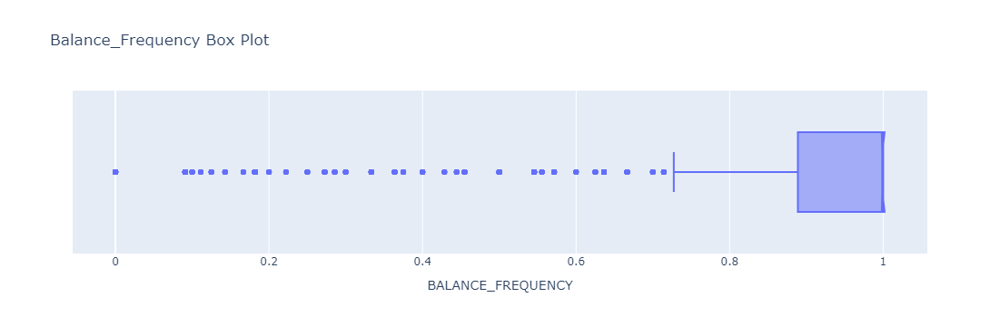

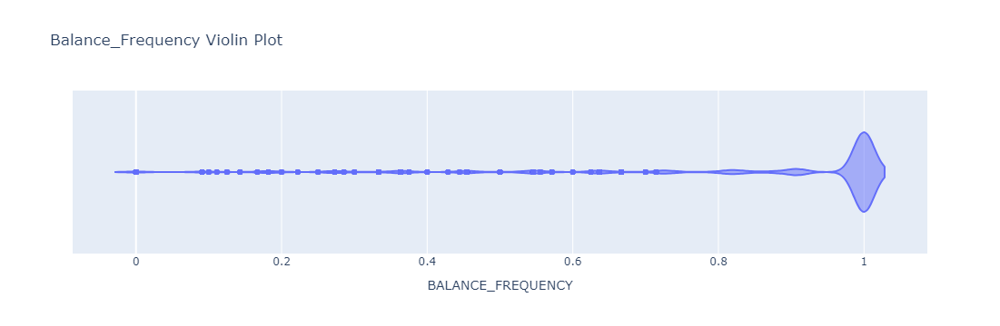

In [16]:
feature_analysis(2)

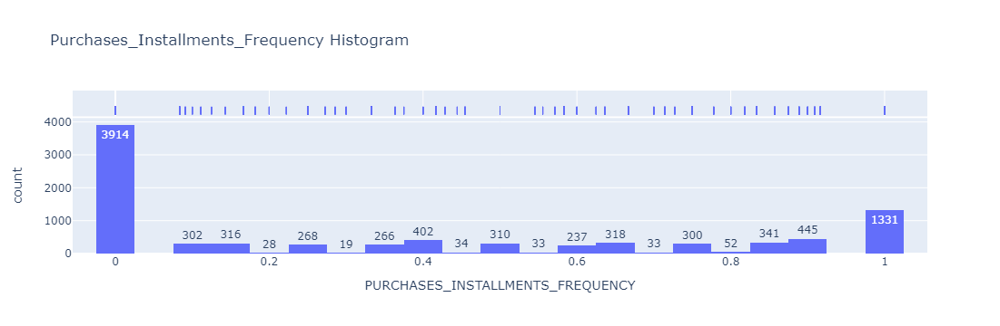

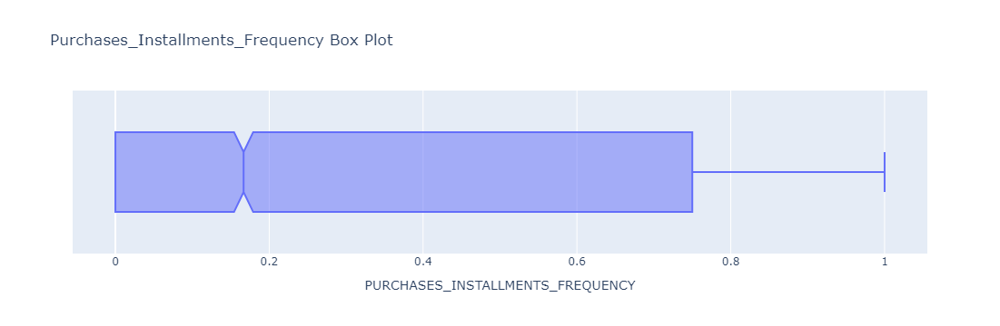

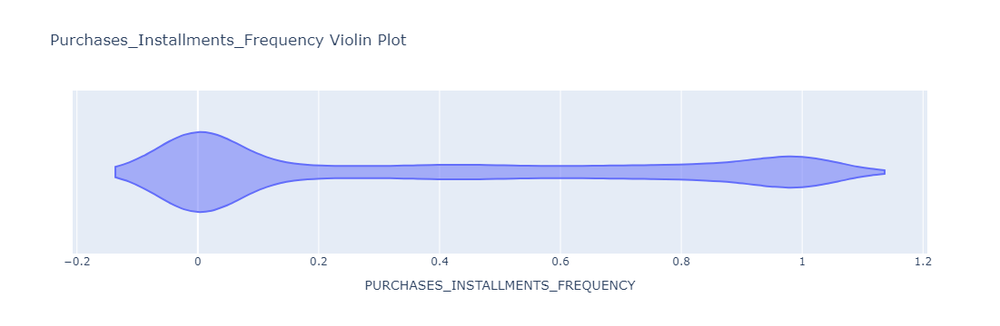

In [17]:
feature_analysis(9)

Relative Plot Of Some Selected Features: A Data Subset


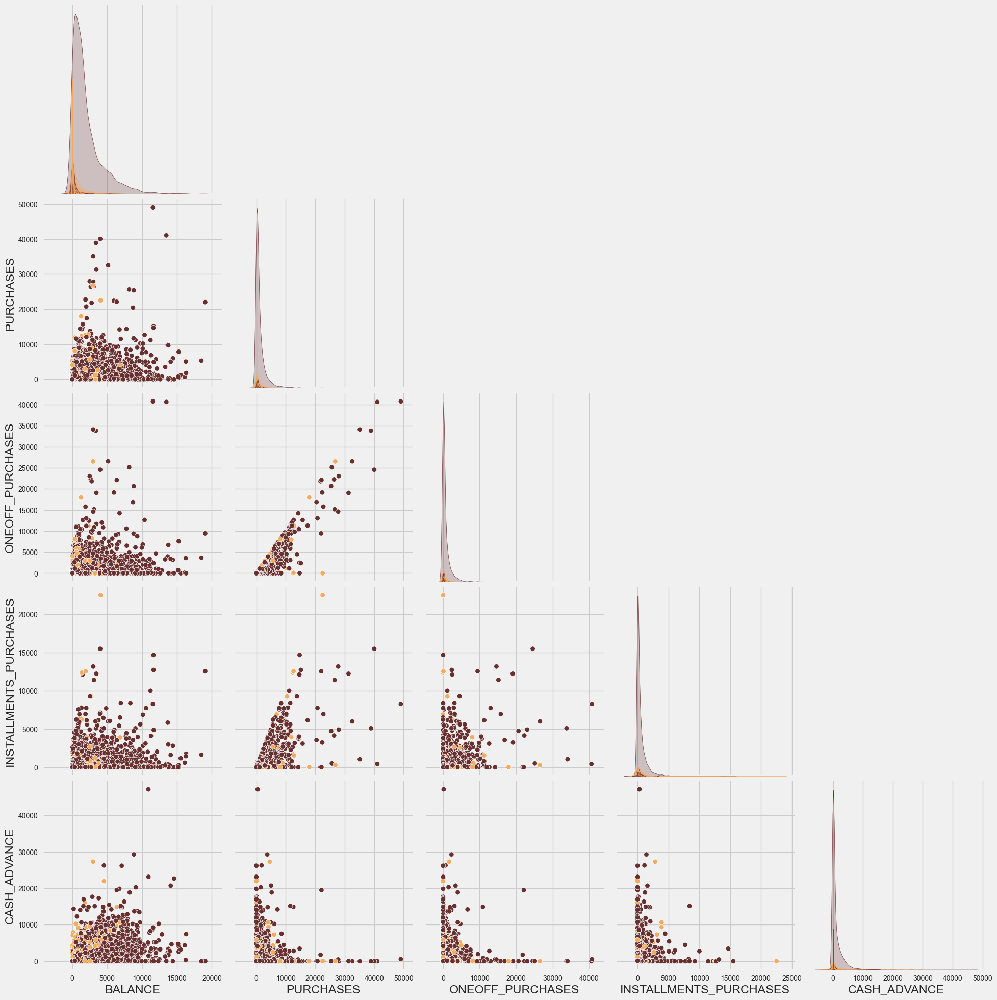

In [18]:

# Plotting following features
To_Plot = ["BALANCE", "BALANCE_FREQUENCY", "PURCHASES", "ONEOFF_PURCHASES", "INSTALLMENTS_PURCHASES", "CASH_ADVANCE"]
print("Relative Plot Of Some Selected Features: A Data Subset")
g = sns.pairplot(data[To_Plot], hue="BALANCE_FREQUENCY", palette=(["#682F2F", "#F3AB60"]), corner=True, diag_kind='kde', height=4)

# Remove the legend on the right
g._legend.remove()

plt.show()

<br>

### Dimensionality Reduction

In [19]:
#Initiating PCA to reduce dimentions aka features to 3
pca = PCA(n_components=3)
pca.fit(scaled_data)
PCA_ds = pd.DataFrame(pca.transform(scaled_data), columns=(["col1","col2", "col3"]))
PCA_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,8949.0,6.351930e-17,2.154126,-6.886540,-1.705489,-0.329909,1.256096,14.789431
col2,8949.0,0.000000e+00,1.695471,-2.731313,-1.262975,-0.241585,0.891107,19.872087
col3,8949.0,6.351930e-18,1.579745,-6.572202,-0.947338,0.153198,1.100878,7.182025


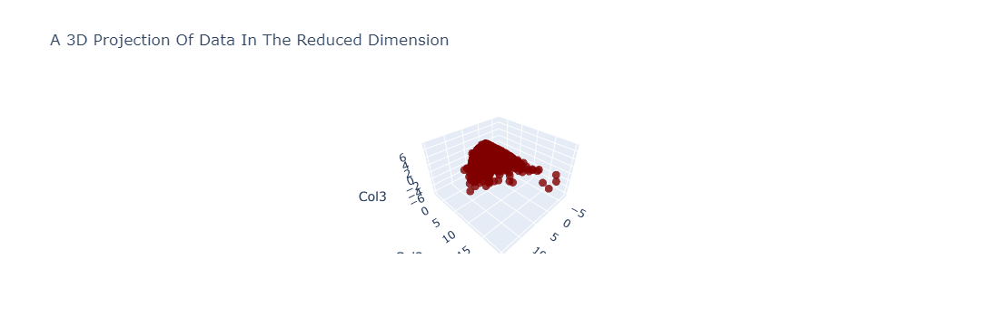

In [20]:
fig = go.Figure(data=[go.Scatter3d(
    x=PCA_ds["col1"],
    y=PCA_ds["col2"],
    z=PCA_ds["col3"],
    mode='markers',
    marker=dict(
        size=5,
        color='maroon',  # You can set the color as needed
        opacity=0.8
    )
)])

# Update layout
fig.update_layout(
    title='A 3D Projection Of Data In The Reduced Dimension',
    scene=dict(
        xaxis_title='Col1',
        yaxis_title='Col2',
        zaxis_title='Col3'
    )
)

# Show plot
fig.show()

### Detemining the no of Clusters(k)

Elbow Method to determine the number of clusters to be formed:


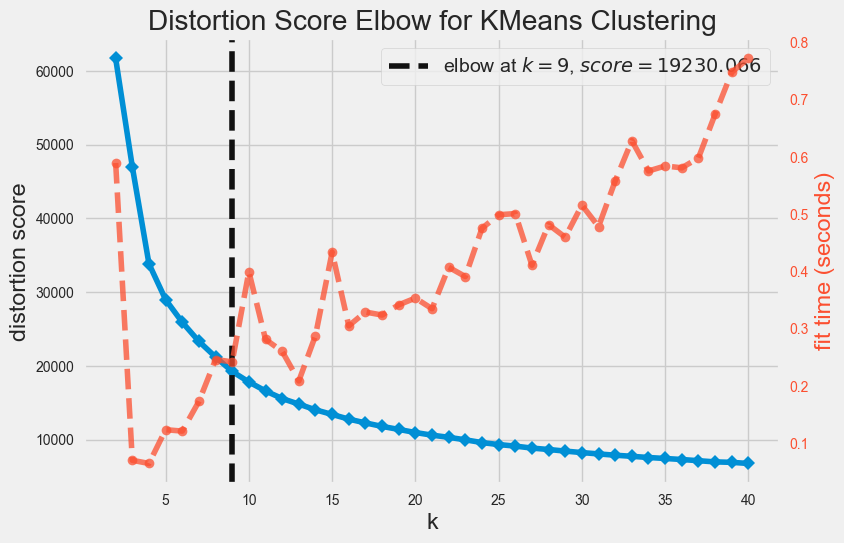

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [21]:
# Quick examination of elbow method to find numbers of clusters to make.
print('Elbow Method to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(KMeans(), k=40)
Elbow_M.fit(PCA_ds)
Elbow_M.show()

### Applying KMeans Algorithm

In [22]:
# Initialize the final K Means Model
k_means = KMeans(
    n_clusters = 10,
    n_init = 'auto',
    random_state = 42
)

# Fit / Train the model
k_means.fit(scaled_data)

KMeans(n_clusters=10, n_init='auto', random_state=42)

In [23]:
# Get cluster labels
cluster_labels = k_means.labels_

# Apply t-SNE to reduce the dimensionality to 3
tsne = TSNE(
    n_components=3,
    random_state=42
)
tsne_result = tsne.fit_transform(scaled_data)

<br>

**Applying t-SNE dimensionality reduction to visualise clusters**

In [24]:
# Apply t-SNE to reduce the dimensionality to 2
tsne = TSNE(
    n_components=2,
    random_state=42
)
tsne_result_2d = tsne.fit_transform(scaled_data)

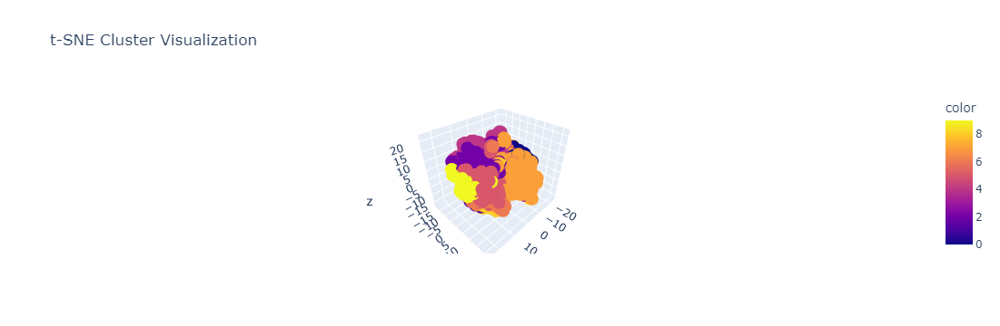

In [25]:
# Visualizing t-SNE reduction
tsne_3d_fig = px.scatter_3d(
    x = tsne_result[:, 0],
    y = tsne_result[:, 1],
    z = tsne_result[:, 2],
    color = cluster_labels,
    title = "t-SNE Cluster Visualization"
)
tsne_3d_fig.show()

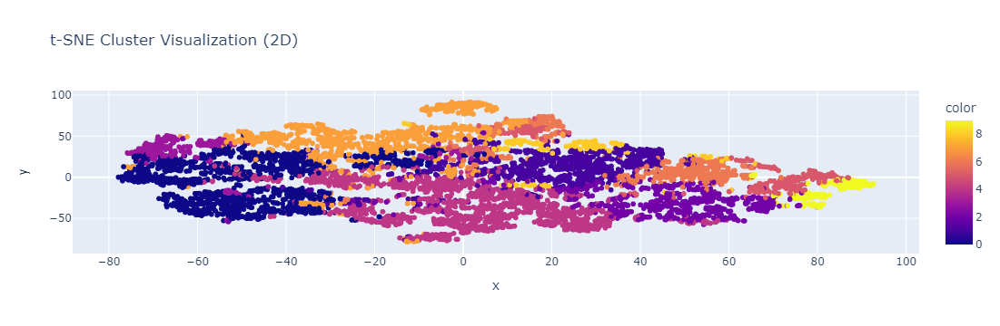

In [26]:
# Visualizing t-SNE reduction
tsne_2d_fig = px.scatter(
    x = tsne_result_2d[:, 0],
    y = tsne_result_2d[:, 1],
    color = cluster_labels,
    title = "t-SNE Cluster Visualization (2D)"
)
tsne_2d_fig.show()

### Evaluating Model

In unsupervised clustering, there isn't a labeled target variable for model evaluation. Instead, the focus shifts to understanding the inherent patterns within the data clusters. In this section, our objective is to delve into the data through exploratory data analysis (EDA) to discern these patterns and characterize the nature of the clusters.

We'll investigate the data in relation to the formed clusters, aiming to extract insights and draw conclusions about their underlying structures and characteristics.

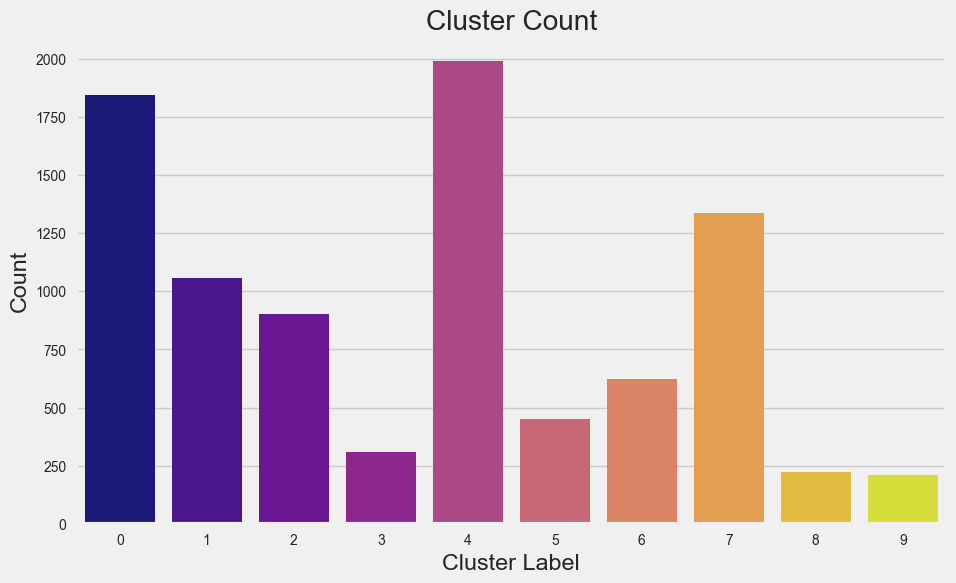

In [27]:
cluster_colors = ['#0d0887', '#46039f', '#7201a8', '#9c179e', '#bd3786', '#d8576b', '#ed7953', '#fb9f3a', '#fdca26', '#f0f921']

# Countplot
plt.figure(figsize=(10, 6))
sns.countplot(x=cluster_labels, palette=cluster_colors, order=np.unique(cluster_labels))
plt.title('Cluster Count')
plt.xlabel('Cluster Label')
plt.ylabel('Count')
plt.show()

In [28]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=9)
# fit model and predict clusters
yhat_AC = AC.fit_predict(PCA_ds)
PCA_ds["Clusters"] = yhat_AC
data["Clusters"] = yhat_AC

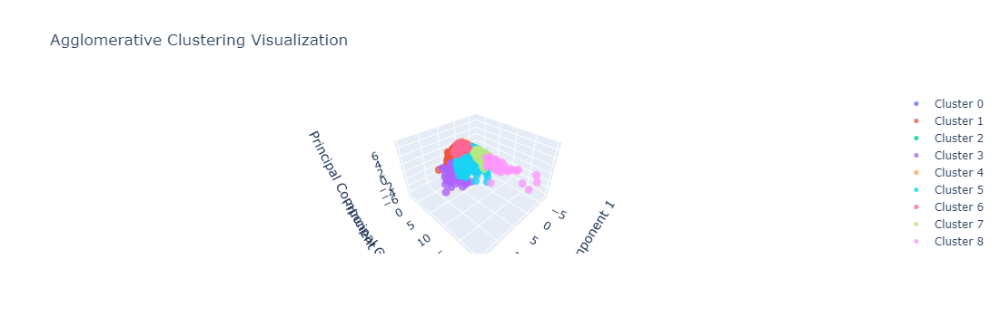

In [29]:
fig = go.Figure()

# Adding data points for each cluster
for cluster_label in np.unique(yhat_AC):
    cluster_data = PCA_ds[yhat_AC == cluster_label].values  # Convert to numpy array
    fig.add_trace(go.Scatter3d(
        x=cluster_data[:, 0],
        y=cluster_data[:, 1],
        z=cluster_data[:, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=cluster_label,  # Color by cluster label
            colorscale='Viridis',  # You can choose any other colorscale
            opacity=0.8
        ),
        name=f'Cluster {cluster_label}'
    ))

# Set title and axis labels
fig.update_layout(
    title='Agglomerative Clustering Visualization',
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    )
)

# Show the plot
fig.show()


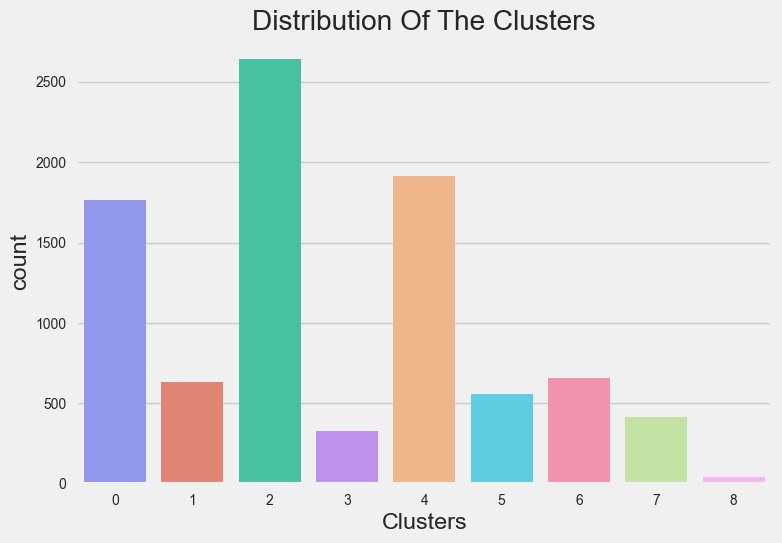

In [30]:
#Plotting countplot of clusters
pal = ["#828bfb","#f27762", "#33d6ab","#bc82fb", "#ffb47b", "#47dcf5","#ff85a8","#c5ed99","#ffacff"]
pl = sns.countplot(x=data["Clusters"], palette= pal)
pl.set_title("Distribution Of The Clusters")
plt.show()

In [31]:
#Dropping the outliers by setting a cap on Age and income. 
data = data[(data["PURCHASES"]<20000)]
data = data[(data["BALANCE"]<15000)]
data = data[(data["CREDIT_LIMIT"]<22000)]
data = data[(data["PAYMENTS"]<30000)]
data = data[(data["CASH_ADVANCE"]<20000)]
data = data[(data["ONEOFF_PURCHASES"]<10000)]

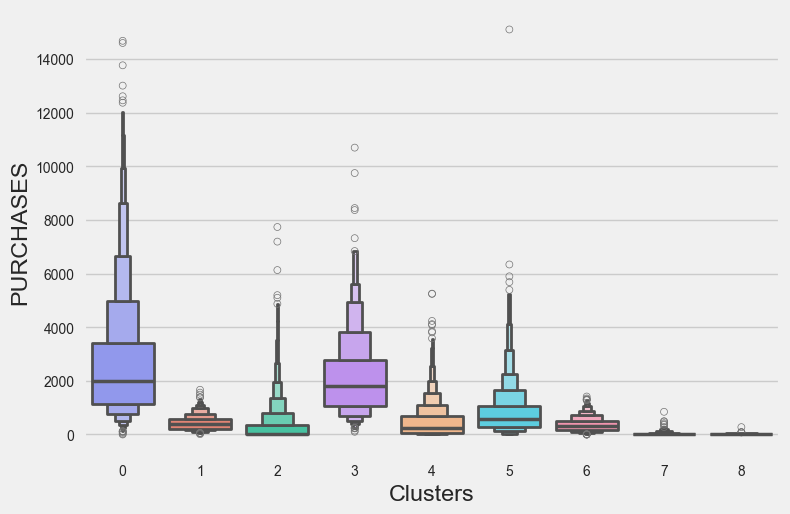

In [39]:
plt.figure()
pl=sns.boxenplot(x=data["Clusters"], y=data["PURCHASES"], palette=pal)
plt.show()


In this graph, it's evident that cluster 0 exhibits the highest volume of purchases, ranging predominantly between 1000 to 3000 in density. Following closely behind is cluster 3.

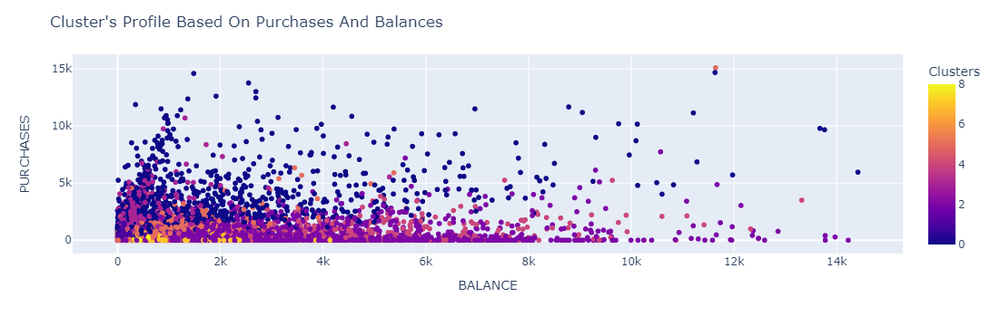

In [32]:

fig = px.scatter(data_frame=data, x=data["BALANCE"], y=data["PURCHASES"], color=data["Clusters"], color_discrete_sequence=pal)
fig.update_layout(title="Cluster's Profile Based On Purchases And Balances")
fig.show()

**0th:**  cluster states that average purchases are under 5000 and leftovers are spreadout having more purchases and average balance below 3000 and leftovers are spreadout having more balances.<br>
**4th:** cluster states that balance extends to 6000 and purchases are below 3000.<br> 
**7th:** cluster states that balances is almost  3000 and there are no purchases.<br> 
**6th:** cluster states that low balance and purchases upto 1000.<br> 
**2nd:** cluster states that high balance till 10000 and low purchases upto 2000.<br>
**1st:** cluster states that low balance and purchases below 1000.<br>

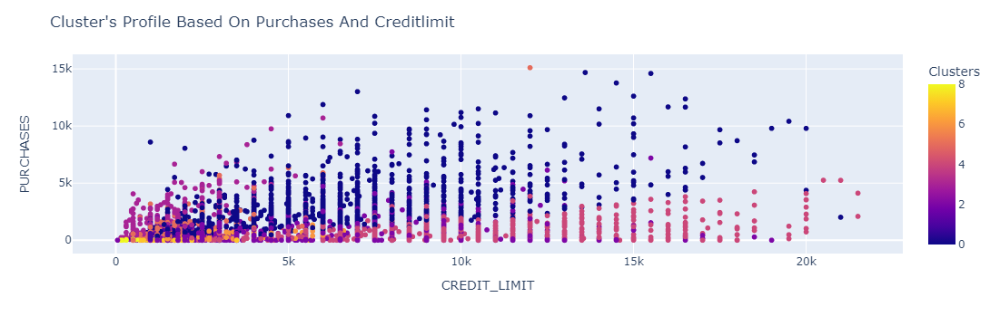

In [33]:
fig = px.scatter(data_frame=data, x=data["CREDIT_LIMIT"], y=data["PURCHASES"], color=data["Clusters"], color_discrete_sequence=pal)
fig.update_layout(title="Cluster's Profile Based On Purchases And Creditlimit")
fig.show()

**0th:** cluster states that most purchases are under 5000 and creditlimit is under 10000.<br>
**4th:** cluster states that credit limit lies between 500 to 3000 and purchases are under 200.<br>
**7th:** cluster states that purchases are under 5000 and credit limit is evenly distributed under 3000.<br>
**1st:** cluster states that most purchases are under 3000 and mostly credit limit lies between 0 to 5000 and the remaining is evenly spreadout between 5000 to 15000.<br>
**2nd:** cluster states that purchases are evenly spread till 15000 and credit limit is between 1000 to 2500 on discrete concentrated points.<br>
**6th:** cluster states that credit limit is evenly distributed but concentrated on discrete points under 6000 and purchases are evenly spreadout under 1000.<br>

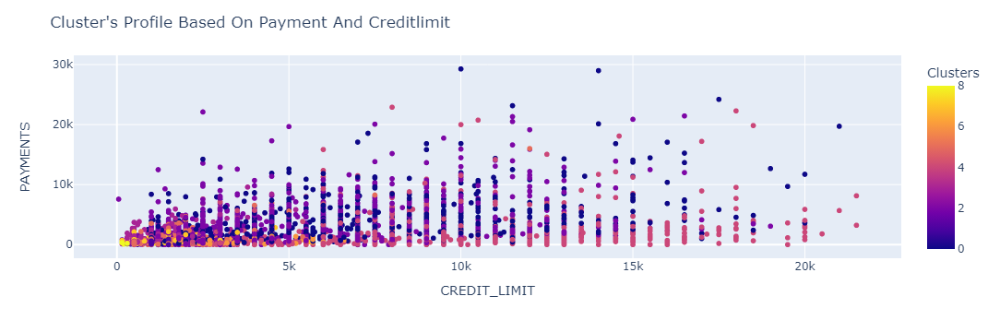

In [34]:
fig = px.scatter(data_frame=data, x=data["CREDIT_LIMIT"], y=data["PAYMENTS"], color=data["Clusters"], color_discrete_sequence=pal)
fig.update_layout(title="Cluster's Profile Based On Payment And Creditlimit")
fig.show()

**0th:** cluster states that credit limit is densely  distributed between 0 to 5000 and evenly distributed upto 15000 and payment is evenly distributed under 10000.<br>
**4th:** cluster states that creditlimit is evenly distributed between 0 to 3000 and payment is under 2000.<br>
**7th:** cluster states that payment is evenly distributed under 4000 and credit limit is under 3000.<br>
**1st:** cluster states that payment is under 10000 and creditlimit is concentrated under 5000 and normal under 10000.<br>
**2nd:** cluster states that creditlimit is between 1000 to 2500 under discrete points and payment is evenly distributed under 15000.<br>
**6th:** cluster states that payment is evenly distributed under 1000 and creditlimit is most concentrated around 2500 in discrete values and other discrete values between 5000 and 6000.<br>

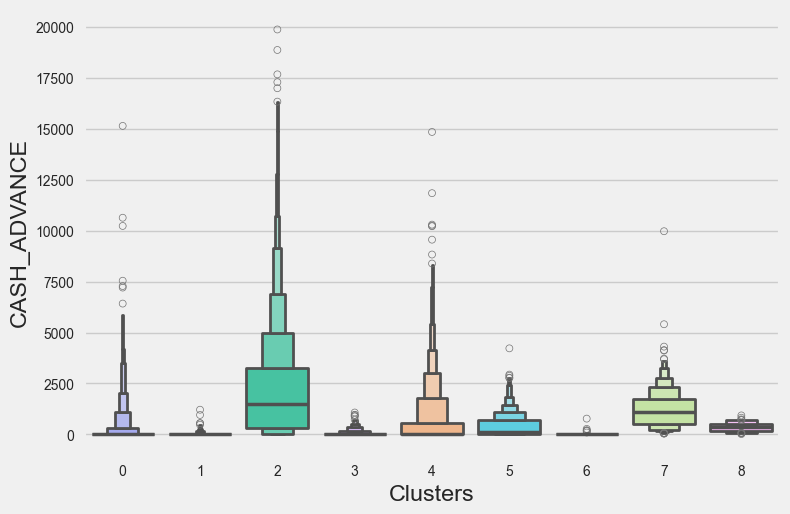

In [36]:
plt.figure()
pl=sns.boxenplot(x=data["Clusters"], y=data["CASH_ADVANCE"], palette=pal)
plt.show()

Absolutely, considering the graph depicts,

**Cluster 0:** Low Spenders

This cluster likely represents customers with the lowest credit card spending habits. They might be:
New cardholders who haven't utilized the credit limit much.
Individuals who primarily use debit cards or cash for everyday purchases.
Customers with lower overall income or a preference for budgeting and paying off balances quickly.

**Clusters 1 & 2:** Moderate Spenders (with Cash Advance Tendency)

These clusters represent customers with moderate spending on their credit cards, potentially using them for regular purchases. Additionally, they exhibit a tendency to use cash advances, which could indicate:
A need for quick access to cash for unexpected expenses.
Customers who might be comfortable managing credit and interest rates associated with cash advances.

**Cluster 3:** High Spenders

This cluster represents customers with the highest credit card spending habits. They might be:
Individuals with high incomes who use their credit cards for significant purchases.
Customers who travel frequently or have expensive lifestyles.
People who might be susceptible to overspending or carrying a high balance.

**Clusters 4, 5, 6, 7 & 8:** Mid-Tier Spenders

These clusters represent customers with credit card spending patterns that fall between the low and high spender categories. They might be:
Individuals who use their credit cards regularly but maintain a moderate balance.
Customers who utilize rewards programs or benefits associated with their credit cards.


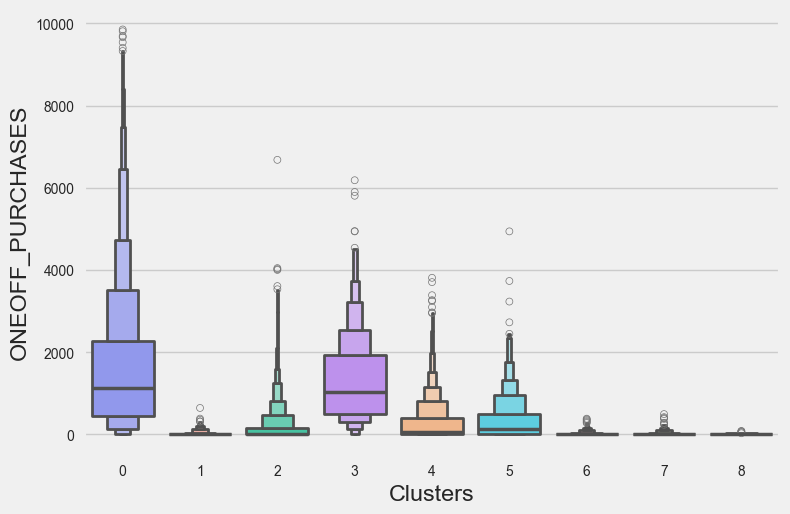

In [37]:
plt.figure()
pl=sns.boxenplot(x=data["Clusters"], y=data["ONEOFF_PURCHASES"], palette=pal)
plt.show()

**Cluster 0**

This cluster likely represents customers with the lowest number of one-off purchases. They might be:
New cardholders who are still in the trial phase of using their credit card.
Individuals who prefer debit cards or cash for most purchases.
Customers who are meticulous about budgeting and paying off balances quickly, so they avoid making a lot of purchases at once.

**Clusters 1, 2, 3, 4 & 5**

These clusters represent customers who make a moderate number of one-off purchases. They likely use their credit cards regularly for various purchases.

**Clusters 6, 7 & 8**

These clusters represent customers with the highest number of one-off purchases. They might be:
Individuals who frequently use their credit cards for various purchases throughout the month.
Customers who might be strategically using their credit cards to maximize reward points or benefits programs.
People who are more susceptible to impulse purchases or might be carrying a high balance.

<Figure size 800x550 with 0 Axes>

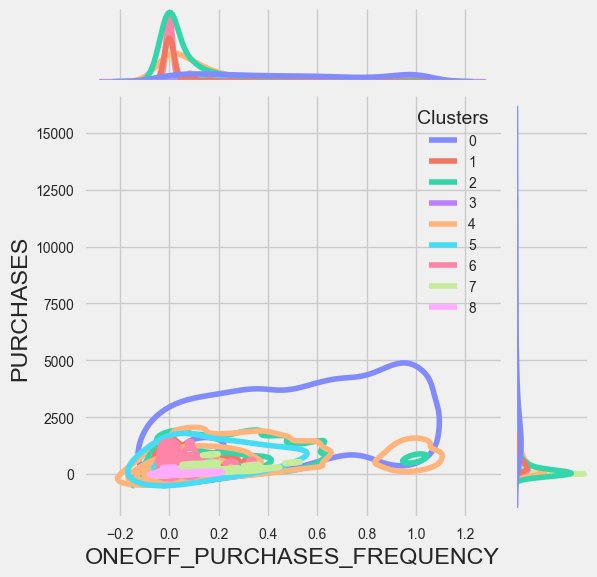

<Figure size 800x550 with 0 Axes>

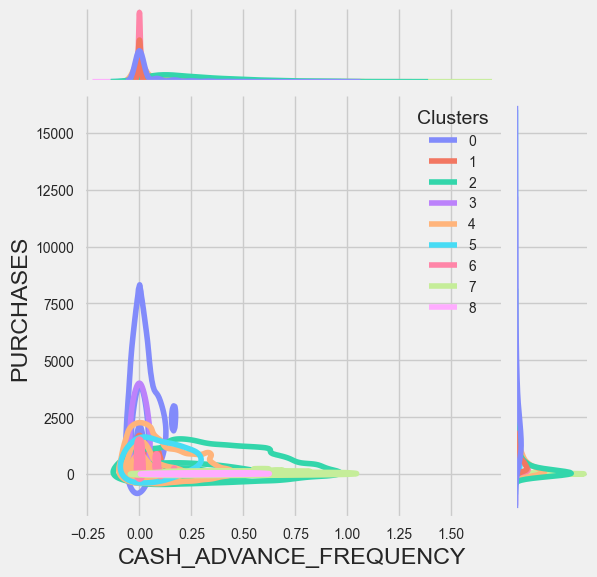

In [38]:
Personal = [ "ONEOFF_PURCHASES_FREQUENCY","CASH_ADVANCE_FREQUENCY"]
for i in Personal:
    plt.figure()
    sns.jointplot(x=data[i], y=data["PURCHASES"], hue =data["Clusters"], kind="kde", palette=pal)
    plt.show()

For 1st Graph,

**Cluster 0** (Low Purchase Frequency, Low One-Off Purchase Frequency)

This cluster likely represents customers with the lowest overall credit card usage. They might be:
New cardholders who are still in the trial phase of using their credit card.
Individuals who prefer debit cards or cash for most purchases.
Customers who are meticulous about budgeting and paying off balances quickly, so they avoid making a lot of purchases and tend not to make large, one-off purchases.

**Clusters 1, 2, 3, 4 & 5** (Low-to-Moderate Purchase Frequency, Moderate One-Off Purchase Frequency)

These clusters represent customers who make a moderate number of total purchases and have a moderate tendency to make one-off purchases. They likely use their credit cards regularly for various purchases throughout the month, with occasional larger purchases mixed in.

**Clusters 6, 7 & 8** (High Purchase Frequency, High One-Off Purchase Frequency)

These clusters represent customers with the highest overall credit card usage and the highest tendency to make one-off purchases. They might be:
Individuals who frequently use their credit cards for various purchases throughout the month, and also tend to make larger, one-off purchases.
Customers who might be strategically using their credit cards to maximize reward points or benefits programs associated with one-off purchases.
People who are more susceptible to impulse purchases or might be carrying a high balance.

For 2nd Graph,

**Cluster 0** (Low Purchases, Low Cash Advance Frequency)

This cluster likely represents customers with the lowest credit card usage and the least frequent use of cash advances. They might be:
New cardholders who are still in the trial phase of using their credit card.
Individuals who primarily use their credit cards for small, everyday purchases and rarely need cash advances.
Customers who are meticulous about budgeting and managing their credit card balances, and so they avoid cash advances.

**Clusters 1 & 2** (Moderate Purchases, Moderate Cash Advance Frequency)

These clusters represent customers who make a moderate amount of purchases and use cash advances with some regularity. They likely:
Use their credit cards for regular purchases throughout the month.
Occasionally rely on cash advances to supplement their spending or access quick cash.

**Cluster 3** (High Purchases, High Cash Advance Frequency)

This cluster represents customers with the highest credit card spending and the most frequent use of cash advances. They might be:
Individuals with high incomes who use their credit cards for significant purchases and also rely on cash advances for various needs.
Customers who travel frequently or have expensive lifestyles, and they may use cash advances to cover these costs.
People who might be susceptible to overspending or carrying a high balance on their credit cards, and they use cash advances to access additional funds.

**Clusters 4, 5, 6, 7 & 8** (Moderate Purchases, Varied Cash Advance Frequency)

These clusters represent customers with a moderate amount of spending on their credit cards, but their cash advance usage varies. They might be:
Individuals who use their credit cards regularly but rely on cash advances infrequently.
Customers who use a mix of credit card purchases and cash advances to manage their finances.

<br>

## Insights and Strategies

Now lets take insights found from clusters and conjure market strategies for these clusters to better attend to these customers, and maximize profits henceforth.
*3th,5th,8th,9th* clusters are neglected because of their low count.

To determine which clusters the bank should target to earn more profit, we need to consider several factors such as the potential for credit card usage, repayment behavior, credit limits, and balance management. Based on the provided information, the following clusters seem to hold promise for targeting:

**Cluster 2:**

This cluster comprises customers with high credit limits (up to 15000) and relatively low purchases (up to 2000).
These customers have the potential for higher spending given their substantial credit limits, which could translate to higher revenue through interest charges and transaction fees.
However, since their purchases are relatively low, the risk of default might be lower compared to customers with higher spending habits.

**Cluster 4:**

Customers in this cluster have credit limits ranging from 500 to 3000 and make purchases below 200.
They may be more likely to utilize credit cards for smaller purchases and may have a better repayment behavior due to their lower credit limits.
Although individual transactions may be small, the cumulative effect across a larger customer base can generate significant revenue through transaction fees and interest charges.

**Cluster 6:**

Customers in this cluster have relatively low credit limits but make purchases evenly spread out under 1000.
They may represent a segment of customers who consistently use their credit cards for various smaller expenses.
While individual transactions may not be large, the frequent usage can contribute to steady revenue streams from transaction fees and interest charges.

These clusters present opportunities for the bank to target customers who are likely to use credit cards regularly, albeit with varying spending behaviors and credit limits. By focusing on these clusters, the bank can tailor marketing strategies, offer appropriate credit products, and provide targeted incentives to encourage spending while mitigating the risks associated with higher credit limits and spending habits. Additionally, proactive credit monitoring and personalized financial advice can help manage potential risks and enhance customer satisfaction, leading to long-term profitability for the bank.


<br>

### Marketing Strategies

Certainly! Here are tailored marketing strategies for each cluster to maximize profitability:

**Cluster 2:**

Targeted Credit Limit Increases: Identify customers within this cluster who consistently maintain low balances relative to their credit limits. Offer targeted credit limit increases to encourage higher spending while ensuring responsible credit management.
Premium Rewards Program: Introduce a premium rewards program tailored to high credit limit customers. Offer exclusive benefits such as cashback rewards, travel perks, and concierge services to incentivize higher spending and card utilization.
Personalized Offers: Utilize transaction data and spending patterns to offer personalized promotions and discounts on high-value purchases. Leverage predictive analytics to anticipate customer needs and provide relevant offers in real-time.

**Cluster 4:**

Cashback Incentives: Introduce cashback incentives for low-value transactions to encourage frequent card usage among customers in this cluster. Offer higher cashback percentages for categories such as dining, groceries, and entertainment to incentivize spending in key areas.
Credit Building Programs: Launch credit building programs targeted at customers with lower credit limits. Offer educational resources, credit score monitoring tools, and incentives for timely payments to help customers improve their creditworthiness and qualify for higher credit limits in the future.
Small Business Solutions: Develop specialized credit card products tailored to small business owners within this cluster. Offer features such as expense tracking, customizable spending limits, and rewards geared towards business expenses to attract entrepreneurial customers.

**Cluster 6:**

Microtransaction Rewards: Implement a microtransaction rewards program designed to incentivize frequent card usage for smaller purchases. Offer tiered rewards based on transaction frequency, encouraging customers to use their credit cards for everyday expenses.
Financial Wellness Resources: Provide financial wellness resources and tools to help customers in this cluster better manage their finances. Offer budgeting apps, savings calculators, and personalized tips to empower customers to make informed financial decisions and maximize the value of their credit cards.
Targeted Education Campaigns: Launch targeted education campaigns highlighting the benefits of responsible credit card usage and the potential rewards associated with regular card usage. Emphasize the convenience, security, and rewards offered by credit cards to encourage adoption among customers who may be hesitant to use credit.

By tailoring marketing strategies to the unique characteristics and preferences of each cluster, the bank can effectively drive card usage, increase customer engagement, and maximize profitability. Additionally, leveraging data-driven insights and customer segmentation techniques will enable the bank to deliver personalized experiences that resonate with each cluster's needs and preferences.
